LIBRERIAS

In [ ]:
!pip install git+git://github.com/PnS2019/pnslib.git

  Cloning git://github.com/PnS2019/pnslib.git to /tmp/pip-req-build-ap5w2sfn
  Running command git clone -q git://github.com/PnS2019/pnslib.git /tmp/pip-req-build-ap5w2sfn
  Created wheel for pnslib: filename=pnslib-0.1.0a1-cp37-none-any.whl size=1489618 sha256=2644eb36a097e3167b43f7e072dfb18e57eeee957a670e69ff9e88b066782790
  Stored in directory: /tmp/pip-ephem-wheel-cache-677eepbq/wheels/a2/8e/a9/c62e72840009deaa723b3a113d5c3b90acac77098d16e90eca
Successfully built pnslib


In [ ]:
import pandas as pd
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.feature import hog
from skimage import data, exposure
from tensorflow import keras
import tensorflow as tf
from sklearn import metrics
from pnslib import utils
from tensorflow.keras.losses import categorical_crossentropy

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.datasets import make_blobs
from sklearn.preprocessing import MinMaxScaler

In [ ]:
face_cascade = cv2.CascadeClassifier(
    utils.get_haarcascade_path('haarcascade_frontalface_default.xml'))
from scipy.spatial import distance

In [ ]:
import os
from bs4 import BeautifulSoup
from keras.preprocessing.image import img_to_array,load_img
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, recall_score, confusion_matrix

In [ ]:
histories = []

######DATOS TRAINING AND TEST

In [ ]:
datasetPath = '/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/'
maskPath = datasetPath + 'with_mask/'
nonMaskPath = datasetPath + 'without_mask/'
y_mask = []
x_mask = []
y_no_mask = []
x_no_mask = []
iterador = 0


ruta_base = nonMaskPath
classes = os.listdir(nonMaskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(50,50))
  x_no_mask.append(resized_img/255.0)
  y_no_mask.append(0)
print(np.shape(y_no_mask))

ruta_base = maskPath
classes = os.listdir(maskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(50,50))
  x_mask.append(resized_img/255.0)
  y_mask.append(1)
print(np.shape(y_mask))


x_mask = np.array(x_mask)
y_mask = np.array(y_mask)
x_no_mask = np.array(x_no_mask)
y_no_mask = np.array(y_no_mask)

(3828,)
(3725,)


In [ ]:
x =  np.concatenate((x_no_mask,x_mask))
y = np.concatenate((y_no_mask,y_mask))
print('x',x.shape,'y',y.shape)

x (7553, 50, 50, 3) y (7553,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state=0)
print('X_train:',X_train.shape)
print('X_test:',X_test.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

X_train: (5664, 50, 50, 3)
X_test: (1889, 50, 50, 3)
y_train: (5664,)
y_test: (1889,)


In [ ]:
import tensorflow as tf
y_test = tf.keras.utils.to_categorical(y_test) #el one hot encoding
y_train = tf.keras.utils.to_categorical(y_train) 

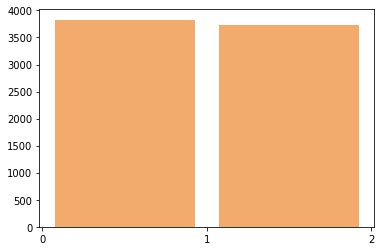

In [ ]:
intervalos = range(min(y), max(y) + 2)
plt.hist(y,bins=intervalos, color='#F2AB6D', rwidth=0.85)
plt.xticks(intervalos)
plt.show()

##VALIDATE 

In [ ]:
img_folder = '/content/drive/MyDrive/proyecto IA2/prueba_test/images/'
annot_folder = '/content/drive/MyDrive/proyecto IA2/prueba_test/annotations/'
desc = []
for dirname, _, filenames in os.walk(annot_folder):
    for filename in filenames:
        desc.append(os.path.join(dirname, filename))

In [ ]:
img_name,label = [],[]

for d in desc:
    content = []
    n = []

    with open(d, "r") as file:
        content = file.readlines()
    content = "".join(content)
    soup = BeautifulSoup(content,"html.parser")
    file_name = soup.filename.string
    name_tags = soup.find_all("name")
    

    for t in name_tags:
        n.append(t.get_text())
        
    # slecting tag with maximum occurence in an image (If it has multiple tags)
    name = max(set(n), key = n.count)
  
    img_name.append(file_name)
    if (name == 'with_mask'):
      name = 1
      label.append(name)
    elif (name == 'mask_weared_incorrect'):
      name = 2
      label.append(name)
    elif (name == 'without_mask'):
      name = 0
      label.append(name)


In [ ]:
labels = pd.get_dummies(label)
labels.head()

In [ ]:
data, target = [],[]
img_h, img_w = 50, 50

for i in range(len(img_name)):
    
    name = img_name[i]
    path = img_folder + name
    

    img = cv2.imread(path)
    img = cv2.resize(img,(50,50))
    image = img/255.0

    # image = load_img(path, target_size = (img_h, img_w))
    # image = img_to_array(image)
    data.append(image)
    target.append(tuple(labels.iloc[i,:]))

In [ ]:
data = np.array(data)
target = np.array(target)
print("data shapes : ",(data.shape))
print("target shapes : ",(target.shape))

data shapes :  (853, 50, 50, 3)
target shapes :  (853, 3)


In [ ]:
array = np.array(label)
eliminar = np.where(array == 2)
print(eliminar)

(array([ 73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832]),)


In [ ]:
data = np.delete(data, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832,370), axis=0)
target = np.delete(target, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832,370), axis=0)
print('eliminados')

eliminados


In [ ]:
array = np.array(target)
eliminar = np.where(array == 2)
print(eliminar)

(array([], dtype=int64), array([], dtype=int64))


In [ ]:
target = np.delete(target,2,axis=1)

In [ ]:
label = np.delete(label, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832,370), axis=0)

In [ ]:
print("data shapes : ",(data.shape))
print("target shapes : ",(target.shape))

data shapes :  (827, 50, 50, 3)
target shapes :  (827, 2)


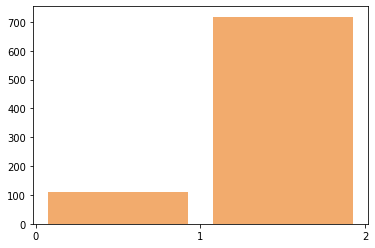

In [ ]:
intervalos = range(min(label), max(label) + 2)
plt.hist(label,bins=intervalos, color='#F2AB6D', rwidth=0.85)
plt.xticks(intervalos)
plt.show()

In [ ]:
nuevo_array = label.tolist()
print(nuevo_array.count(1))
print(nuevo_array.count(0))

713
110


##RED NEURONAL CNN POR NOSOTROS

In [ ]:
primer_modelo = tf.keras.models.Sequential()
primer_modelo.add(tf.keras.layers.Conv2D(200, (3, 3), activation='elu', padding='same', input_shape=(X_train.shape[1], X_train.shape[1], 3)))
primer_modelo.add(tf.keras.layers.BatchNormalization())
primer_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
primer_modelo.add(tf.keras.layers.Conv2D(100, (3, 3), activation='elu', kernel_initializer='glorot_normal', bias_initializer='glorot_normal', padding='same'))
primer_modelo.add(tf.keras.layers.MaxPooling2D((3, 3)))
primer_modelo.add(tf.keras.layers.BatchNormalization())
primer_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
primer_modelo.add(tf.keras.layers.Conv2D(100, (3, 3), activation='elu', kernel_initializer='glorot_normal', bias_initializer='glorot_normal', padding='same'))
primer_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
primer_modelo.add(tf.keras.layers.Flatten())
primer_modelo.add(tf.keras.layers.Dropout(0.5))
primer_modelo.add(tf.keras.layers.Dense(50, activation='elu'))
primer_modelo.add(tf.keras.layers.Dropout(0.2))
primer_modelo.add(tf.keras.layers.Dense(2, activation='softmax'))

primer_modelo.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 50, 50, 200)       5600      
_________________________________________________________________
batch_normalization (BatchNo (None, 50, 50, 200)       800       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 25, 25, 200)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 25, 25, 100)       180100    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 100)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 100)         400       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 4, 100)         0

In [ ]:
opt = tf.keras.optimizers.Adam()
primer_modelo.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
datagen = ImageDataGenerator(
        featurewise_center=False,  
        samplewise_center=False,  
        featurewise_std_normalization=False,  
        samplewise_std_normalization=False,  
        zca_whitening=False,    
        rotation_range=25,    
        width_shift_range=0.1,
        height_shift_range=0.1,  
        horizontal_flip=True,  
        vertical_flip=False)
datagen.fit(X_train)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/proyecto IA2/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

histories.append(primer_modelo.fit(datagen.flow(X_train, y_train,seed=27,shuffle=False), epochs=20,verbose=1,
                    validation_data=(X_test, y_test),callbacks=[cp_callback]))

Epoch 1/20
177/177 [==============================] - 39s 34ms/step - loss: 0.6640 - accuracy: 0.7539 - val_loss: 0.7329 - val_accuracy: 0.5384

Epoch 00001: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 2/20
177/177 [==============================] - 6s 31ms/step - loss: 0.3411 - accuracy: 0.8610 - val_loss: 0.6131 - val_accuracy: 0.7099

Epoch 00002: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 3/20
177/177 [==============================] - 6s 32ms/step - loss: 0.2606 - accuracy: 0.8969 - val_loss: 0.3764 - val_accuracy: 0.8280

Epoch 00003: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 4/20
177/177 [==============================] - 6s 32ms/step - loss: 0.2302 - accuracy: 0.9097 - val_loss: 0.3291 - val_accuracy: 0.8909

Epoch 00004: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 5/20
177/177 [==============================] - 6s 32ms/step - loss: 0.2119 - accuracy: 0.9216 - val_loss: 0.2311 - val_accur

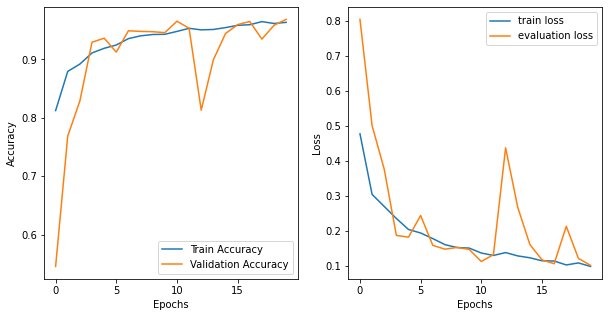

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 2, 1)
ax.plot(histories[0].history['accuracy'], label='Train Accuracy');
ax.plot(histories[0].history['val_accuracy'], label='Validation Accuracy');
ax.set_xlabel('Epochs')
ax.set_ylabel('Accuracy');
ax.legend();
ax = fig.add_subplot(1, 2, 2)
ax.plot(histories[0].history['loss'], label='train loss');
ax.plot(histories[0].history['val_loss'], label='evaluation loss');
ax.legend();
ax.set_xlabel('Epochs');
ax.set_ylabel('Loss');

####Capas

In [ ]:
layer_outputs = [layer.output for layer in primer_modelo.layers ]
activation_model = tf.keras.models.Model(inputs=primer_modelo.input, outputs=layer_outputs)
array = np.expand_dims(X_test[50], axis=0)
activations = activation_model.predict(array)
plt.figure(figsize=(20,3))
for i in range(32):
    plt.subplot(2,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(activations[0][0,:, :, i], cmap='viridis')

In [ ]:
activation_model = tf.keras.models.Model(inputs=primer_modelo.input, outputs=layer_outputs)
array = np.expand_dims(X_test[50], axis=0)
activations = activation_model.predict(array)
plt.figure(figsize=(20,3))
for i in range(32):
    plt.subplot(2,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(activations[4][0,:, :, i], cmap='viridis')

####VALIDATION

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.8480096501809409




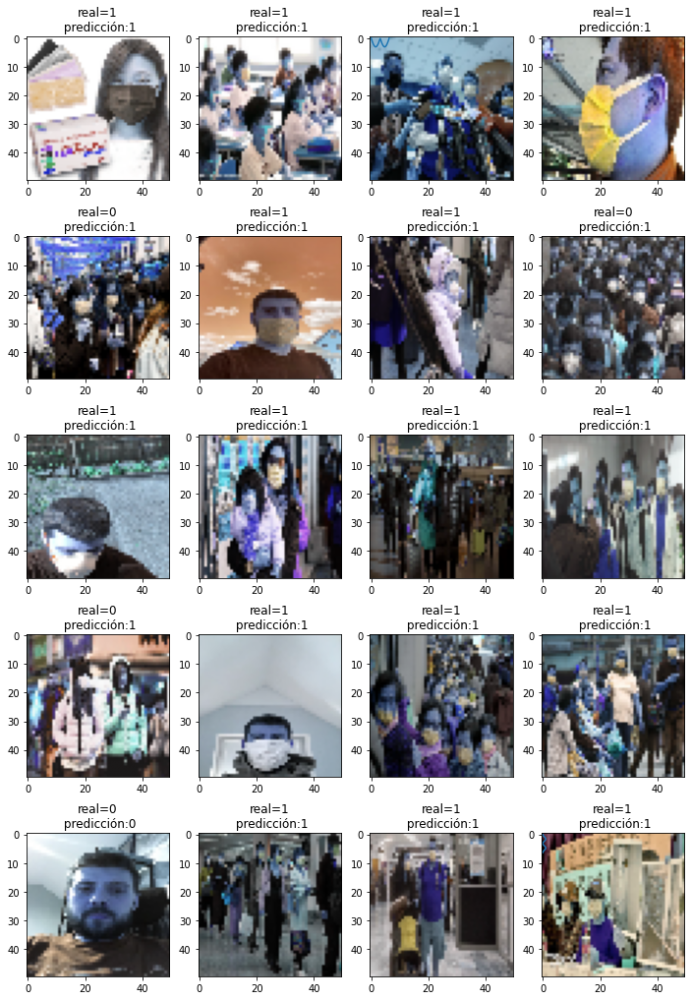

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = primer_modelo.predict_classes(data)


for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


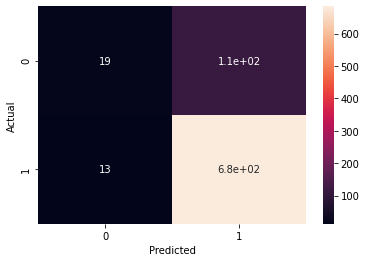

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.5736849838377902
0.7259841593475533
0.5626440154775879


##SEGUNDO MODELO - GRISES

In [ ]:
datasetPath = '/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/'
maskPath = datasetPath + 'with_mask/'
nonMaskPath = datasetPath + 'without_mask/'
y_mask2 = []
x_mask2 = []
y_no_mask2 = []
x_no_mask2 = []
iterador = 0


ruta_base = nonMaskPath
classes = os.listdir(nonMaskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  grayscale_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  resized_img=cv2.resize(grayscale_img,(50,50))
  x_no_mask2.append(resized_img/255.0)
  y_no_mask2.append(0)
print(np.shape(y_no_mask2))

ruta_base = maskPath
classes = os.listdir(maskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  grayscale_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  resized_img=cv2.resize(grayscale_img,(50,50))
  x_mask2.append(resized_img/255.0)
  y_mask2.append(1)
print(np.shape(y_mask2))


x_mask2 = np.array(x_mask2)
y_mask2 = np.array(y_mask2)
x_no_mask2 = np.array(x_no_mask2)
y_no_mask2 = np.array(y_no_mask2)

(3828,)
(3725,)


In [ ]:
x2 =  np.concatenate((x_no_mask2,x_mask2))
y2 = np.concatenate((y_no_mask2,y_mask2))
print('x',x2.shape,'y',y2.shape)

x (7553, 50, 50) y (7553,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train2, X_test2, y_train2, y_test2 = train_test_split(x2, y2, random_state=0)
print('X_train:',X_train2.shape)
print('X_test:',X_test2.shape)
print('y_train:',y_train2.shape)
print('y_test:',y_test2.shape)

X_train: (5664, 50, 50)
X_test: (1889, 50, 50)
y_train: (5664,)
y_test: (1889,)


In [ ]:
X_train2 = X_train2.reshape(-1, 50, 50, 1)
X_test2 = X_test2.reshape(-1, 50, 50, 1)

In [ ]:
import tensorflow as tf
y_test2 = tf.keras.utils.to_categorical(y_test2) #el one hot encoding
y_train2 = tf.keras.utils.to_categorical(y_train2) 

In [ ]:
segundo_modelo = tf.keras.models.Sequential()
segundo_modelo.add(tf.keras.layers.Conv2D(200, (3, 3), activation='elu', padding='same', input_shape=(X_train2.shape[1], X_train2.shape[1], 1)))
segundo_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
segundo_modelo.add(tf.keras.layers.Conv2D(100, (3, 3), activation='elu', kernel_initializer='glorot_normal', bias_initializer='glorot_normal', padding='same'))
segundo_modelo.add(tf.keras.layers.MaxPooling2D((3, 3)))
segundo_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
segundo_modelo.add(tf.keras.layers.Conv2D(100, (3, 3), activation='elu', kernel_initializer='glorot_normal', bias_initializer='glorot_normal', padding='same'))
segundo_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
segundo_modelo.add(tf.keras.layers.Flatten())
segundo_modelo.add(tf.keras.layers.Dropout(0.5))
segundo_modelo.add(tf.keras.layers.Dense(50, activation='elu'))
segundo_modelo.add(tf.keras.layers.Dropout(0.2))
segundo_modelo.add(tf.keras.layers.Dense(2, activation='softmax'))

segundo_modelo.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 50, 50, 200)       2000      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 25, 25, 200)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 25, 25, 100)       180100    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 8, 8, 100)         0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 4, 4, 100)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 4, 4, 100)         90100     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 2, 2, 100)        

In [ ]:
opt = tf.keras.optimizers.Adam(lr=0.001)
segundo_modelo.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
histories.append(segundo_modelo.fit(datagen.flow(X_train2, y_train2,seed=27,shuffle=False), epochs=20,verbose=1,
                    validation_data=(X_test2, y_test2)))

Epoch 1/20
177/177 [==============================] - 4s 19ms/step - loss: 0.6720 - accuracy: 0.5917 - val_loss: 0.4868 - val_accuracy: 0.7676
Epoch 2/20
177/177 [==============================] - 3s 18ms/step - loss: 0.5310 - accuracy: 0.7406 - val_loss: 0.3694 - val_accuracy: 0.8338
Epoch 3/20
177/177 [==============================] - 3s 19ms/step - loss: 0.4656 - accuracy: 0.7854 - val_loss: 0.3513 - val_accuracy: 0.8417
Epoch 4/20
177/177 [==============================] - 3s 18ms/step - loss: 0.4182 - accuracy: 0.8204 - val_loss: 0.3486 - val_accuracy: 0.8444
Epoch 5/20
177/177 [==============================] - 3s 18ms/step - loss: 0.4199 - accuracy: 0.8082 - val_loss: 0.3350 - val_accuracy: 0.8597
Epoch 6/20
177/177 [==============================] - 3s 18ms/step - loss: 0.3881 - accuracy: 0.8314 - val_loss: 0.2939 - val_accuracy: 0.8767
Epoch 7/20
177/177 [==============================] - 3s 19ms/step - loss: 0.3575 - accuracy: 0.8385 - val_loss: 0.3175 - val_accuracy: 0.8502

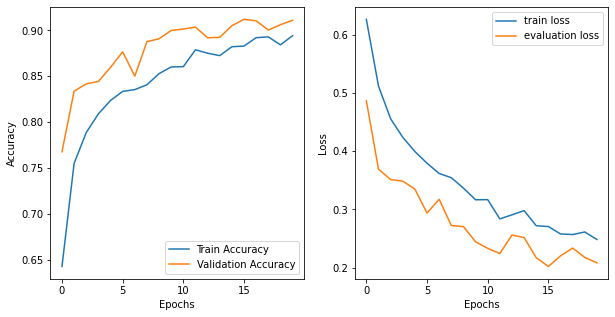

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 2, 1)
ax.plot(histories[1].history['accuracy'], label='Train Accuracy');
ax.plot(histories[1].history['val_accuracy'], label='Validation Accuracy');
ax.set_xlabel('Epochs');
ax.set_ylabel('Accuracy');
ax.legend();
ax = fig.add_subplot(1, 2, 2)

ax.plot(histories[1].history['loss'], label='train loss');
ax.plot(histories[1].history['val_loss'], label='evaluation loss');
ax.legend();
ax.set_xlabel('Epochs');
ax.set_ylabel('Loss');

###Capas

In [ ]:
layer_outputs = [layer.output for layer in segundo_modelo.layers ]
activation_model = tf.keras.models.Model(inputs=segundo_modelo.input, outputs=layer_outputs)
array = np.expand_dims(X_test2[50], axis=0)
activations = activation_model.predict(array)
plt.figure(figsize=(20,3))
for i in range(32):
    plt.subplot(2,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(activations[0][0,:, :, i], cmap='viridis')

In [ ]:
activation_model = tf.keras.models.Model(inputs=segundo_modelo.input, outputs=layer_outputs)
array = np.expand_dims(X_test2[50], axis=0)
activations = activation_model.predict(array)
plt.figure(figsize=(20,3))
for i in range(32):
    plt.subplot(2,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(activations[4][0,:, :, i], cmap='viridis')

###VALIDATION

In [ ]:
datasetPath = '/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/validation/'
maskPath = datasetPath + 'with_mask/'
nonMaskPath = datasetPath + 'no_mask/'
y_mask_validate2 = []
x_mask_validate2 = []
y_no_mask_validate2 = []
x_no_mask_validate2 = []
iterador = 0


ruta_base = nonMaskPath
classes = os.listdir(nonMaskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  grayscale_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  resized_img=cv2.resize(grayscale_img,(50,50))
  x_no_mask_validate2.append(resized_img/255.0)
  y_no_mask_validate2.append(0)
print(np.shape(y_no_mask_validate2))
  

ruta_base = maskPath
classes = os.listdir(maskPath)
for ruta in classes:
  img = cv2.imread(ruta_base + '/' + ruta)
  grayscale_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  resized_img=cv2.resize(grayscale_img,(50,50))
  x_mask_validate2.append(resized_img/255.0)
  y_mask_validate2.append(1)
print(np.shape(x_mask_validate))

x_mask_validate2 = np.array(x_mask_validate2)
y_mask_validate2 = np.array(y_mask_validate2)
x_no_mask_validate2 = np.array(x_no_mask_validate2)
y_no_mask_validate2 = np.array(y_no_mask_validate2)

(10,)
(10, 50, 50, 3)


In [ ]:
data2, target2 = [],[]
img_h, img_w = 50, 50

for i in range(len(img_name)):
    
    name = img_name[i]
    path = img_folder + name
    

    img = cv2.imread(path)
    grayscale_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    img = cv2.resize(grayscale_img,(50,50))
    image = img/255.0

    # image = load_img(path, target_size = (img_h, img_w))
    # image = img_to_array(image)
    data2.append(image)
    target2.append(tuple(labels.iloc[i,:]))

In [ ]:
data2 = np.array(data2)
target2 = np.array(target2)
print("data shapes : ",(data2.shape))
print("target shapes : ",(target2.shape))

data shapes :  (853, 50, 50)
target shapes :  (853, 3)


In [ ]:
data2 = np.delete(data2, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 400, 508, 521, 597, 681, 691, 815, 822, 832), axis=0)
target2 = np.delete(target2, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 400, 508, 521, 597, 681, 691, 815, 822, 832), axis=0)
print('eliminados')

eliminados


In [ ]:
data2 = data2.reshape(-1, 50, 50, 1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.715319662243667




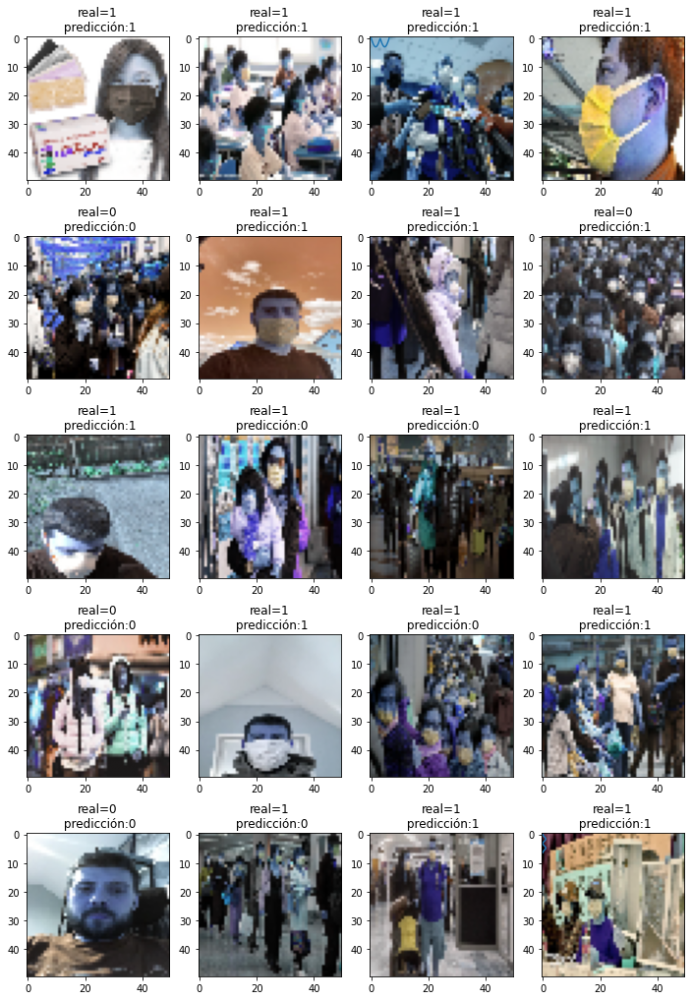

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = segundo_modelo.predict_classes(data2)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


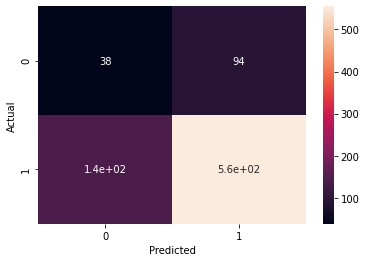

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.5341277098335048
0.5331364492381442
0.5420742576409722


## Transfer Lerning

###RESNET 50

In [ ]:
model_A =  tf.keras.applications.ResNet50(input_shape=X_train[0].shape, weights='imagenet', include_top=False)
model_A.trainable = False
model_A.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 56, 56, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 25, 25, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 25, 25, 64)   256         conv1_conv[0][0]                 
___________________________________________________________________________________________

#### Sección nueva

In [ ]:
model_A.trainable = True
print("Total ayers of Mobilenet: ", len(model_A.layers))
for layer in model_A.layers[10:50]:
  layer.trainable =  False
for layer in model_A.layers[100:170]:
  layer.trainable =  False
print(len(model_A.trainable_variables))

Total ayers of Mobilenet:  175
74


In [ ]:
drop = tf.keras.layers.Dropout(0.5)
prediction_layer = tf.keras.layers.Dense(50,activation='tanh')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
flatten_layer = tf.keras.layers.Flatten()
global_average_layer = tf.keras.layers.GlobalAveragePooling2D() 

In [ ]:
model_B_on_A = tf.keras.Sequential([
  model_A,
  global_average_layer,
  drop,
  prediction_layer
])

model_B_on_A.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 2, 2, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 4098      
Total params: 23,591,810
Trainable params: 4,546,882
Non-trainable params: 19,044,928
_________________________________________________________________


In [ ]:
learning_rate= 0.0001

opt = tf.keras.optimizers.SGD(lr=learning_rate)
model_B_on_A.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])
histories.append(model_B_on_A.fit(datagen.flow(X_train, y_train, batch_size=50), epochs=20,verbose=1, batch_size=30,validation_data=(X_test, y_test)))

Epoch 1/20
114/114 [==============================] - 15s 96ms/step - loss: 1.3026 - accuracy: 0.5540 - val_loss: 1.2276 - val_accuracy: 0.5103
Epoch 2/20
114/114 [==============================] - 8s 72ms/step - loss: 1.0754 - accuracy: 0.6362 - val_loss: 2.2553 - val_accuracy: 0.5103
Epoch 3/20
114/114 [==============================] - 8s 72ms/step - loss: 0.9362 - accuracy: 0.6764 - val_loss: 2.0147 - val_accuracy: 0.5098
Epoch 4/20
114/114 [==============================] - 8s 72ms/step - loss: 0.8659 - accuracy: 0.7053 - val_loss: 1.1551 - val_accuracy: 0.5119
Epoch 5/20
114/114 [==============================] - 8s 73ms/step - loss: 0.7866 - accuracy: 0.7256 - val_loss: 0.7766 - val_accuracy: 0.5437
Epoch 6/20
114/114 [==============================] - 8s 73ms/step - loss: 0.7170 - accuracy: 0.7461 - val_loss: 0.7292 - val_accuracy: 0.6273
Epoch 7/20
114/114 [==============================] - 8s 72ms/step - loss: 0.6920 - accuracy: 0.7442 - val_loss: 0.7131 - val_accuracy: 0.686

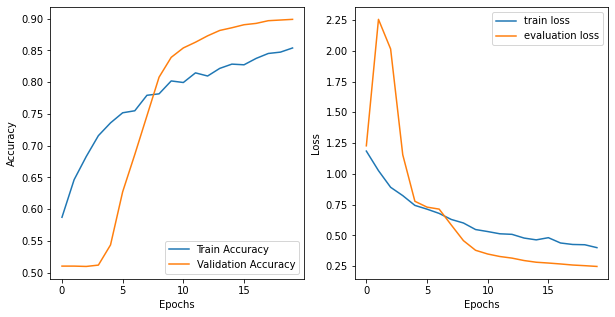

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 2, 1)
ax.plot(histories[2].history['accuracy'], label='Train Accuracy');
ax.plot(histories[2].history['val_accuracy'], label='Validation Accuracy');
ax.set_xlabel('Epochs');
ax.set_ylabel('Accuracy');
ax.legend();
ax = fig.add_subplot(1, 2, 2)
ax.plot(histories[2].history['loss'], label='train loss');
ax.plot(histories[2].history['val_loss'], label='evaluation loss');
ax.legend();
ax.set_xlabel('Epochs');
ax.set_ylabel('Loss');

####VALIDATION

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.6686819830713422




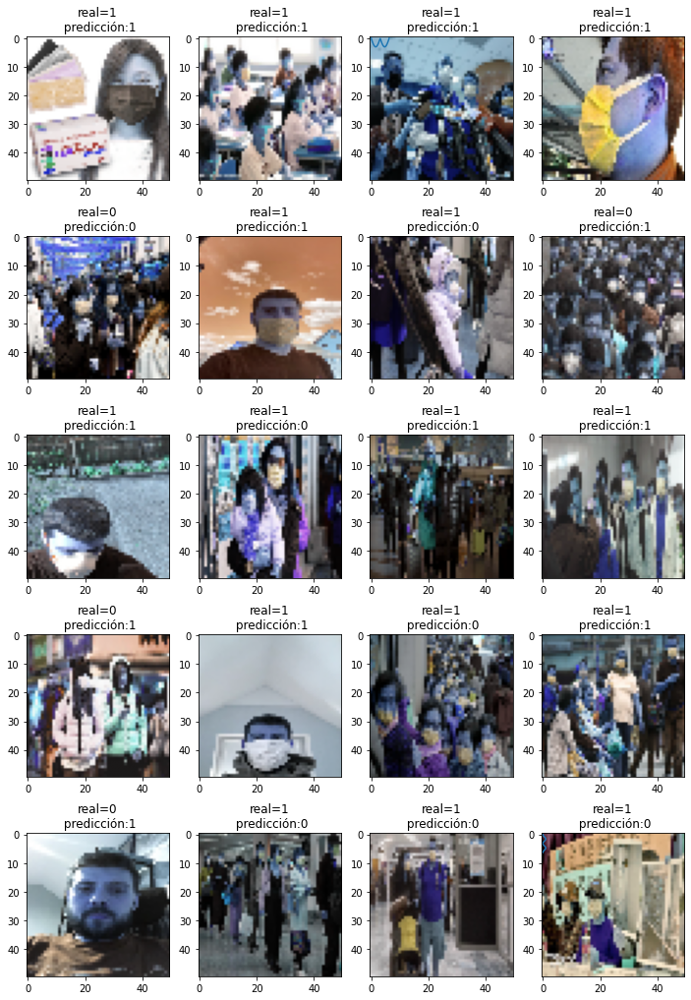

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = model_B_on_A.predict_classes(data)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


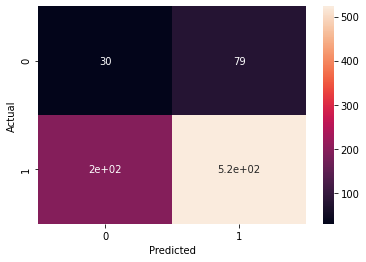

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

###VGG19

In [ ]:
face_cascade = cv2.CascadeClassifier(
    utils.get_haarcascade_path('haarcascade_frontalface_default.xml'))

img = cv2.imread('/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/with_mask/with_mask_1539.jpg')
img = cv2.cvtColor(img, cv2.IMREAD_GRAYSCALE)
faces = face_cascade.detectMultiScale(img,scaleFactor=1.1, minNeighbors=4)
out_img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

for (x,y,w,h) in faces:
    cv2.rectangle(out_img,(x,y),(x+w,y+h),(0,0,255),1)


In [ ]:
vgg19 = tf.keras.applications.VGG19(weights='imagenet',include_top=False,input_shape=(50,50,3))

In [ ]:
for layer in vgg19.layers:
    layer.trainable = False
    
model_vgg19 = tf.keras.models.Sequential()
model_vgg19.add(vgg19)
model_vgg19.add(tf.keras.layers.Flatten())
model_vgg19.add(tf.keras.layers.Dense(2,activation='sigmoid'))
model_vgg19.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 1, 1, 512)         20024384  
_________________________________________________________________
flatten_3 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 2)                 1026      
Total params: 20,025,410
Trainable params: 1,026
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
datagen = ImageDataGenerator(
        featurewise_center=False,  
        samplewise_center=False,  
        featurewise_std_normalization=False,  
        samplewise_std_normalization=False,  
        zca_whitening=False,    
        rotation_range=25,    
        width_shift_range=0.1,
        height_shift_range=0.1,  
        horizontal_flip=True,  
        vertical_flip=False)
datagen.fit(X_train)

In [ ]:
model_vgg19.compile(optimizer="adam",loss="categorical_crossentropy",metrics ="accuracy")
histories.append(model_vgg19.fit_generator(datagen.flow(X_train, y_train, batch_size=50),
                    steps_per_epoch=X_train.shape[0]//50,
                    epochs=20,
                    verbose=1,
                    validation_data=(X_test, y_test)))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
113/113 [==============================] - 9s 61ms/step - loss: 0.5945 - accuracy: 0.6882 - val_loss: 0.3931 - val_accuracy: 0.8322
Epoch 2/20
113/113 [==============================] - 6s 50ms/step - loss: 0.4293 - accuracy: 0.8082 - val_loss: 0.3371 - val_accuracy: 0.8597
Epoch 3/20
113/113 [==============================] - 6s 50ms/step - loss: 0.3740 - accuracy: 0.8396 - val_loss: 0.3137 - val_accuracy: 0.8613
Epoch 4/20
113/113 [==============================] - 6s 50ms/step - loss: 0.3463 - accuracy: 0.8501 - val_loss: 0.2951 - val_accuracy: 0.8719
Epoch 5/20
113/113 [==============================] - 6s 50ms/step - loss: 0.3414 - accuracy: 0.8597 - val_loss: 0.2862 - val_accuracy: 0.8740
Epoch 6/20
113/113 [==============================] - 6s 51ms/step - loss: 0.3322 - accuracy: 0.8558 - val_loss: 0.2790 - val_accuracy: 0.8777
Epoch 7/20
113/113 [==============================] - 6s 50ms/step - loss: 0.3164 - accuracy: 0.8663 - val_loss: 0.2739 - val_accuracy: 0.8798

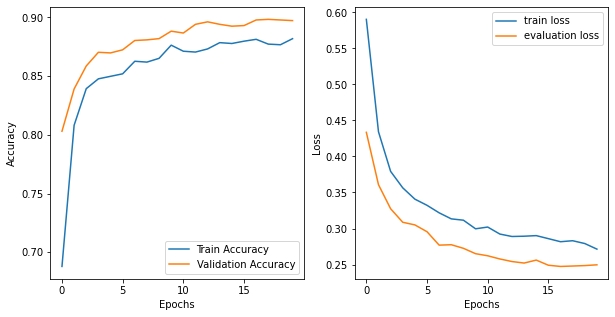

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 2, 1)
ax.plot(histories[3].history['accuracy'], label='Train Accuracy');
ax.plot(histories[3].history['val_accuracy'], label='Validation Accuracy');
ax.set_xlabel('Epochs');
ax.set_ylabel('Accuracy');
ax.legend();
ax = fig.add_subplot(1, 2, 2)
ax.plot(histories[3].history['loss'], label='train loss');
ax.plot(histories[3].history['val_loss'], label='evaluation loss');
ax.legend();
ax.set_xlabel('Epochs');
ax.set_ylabel('Loss');

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.6911942098914354




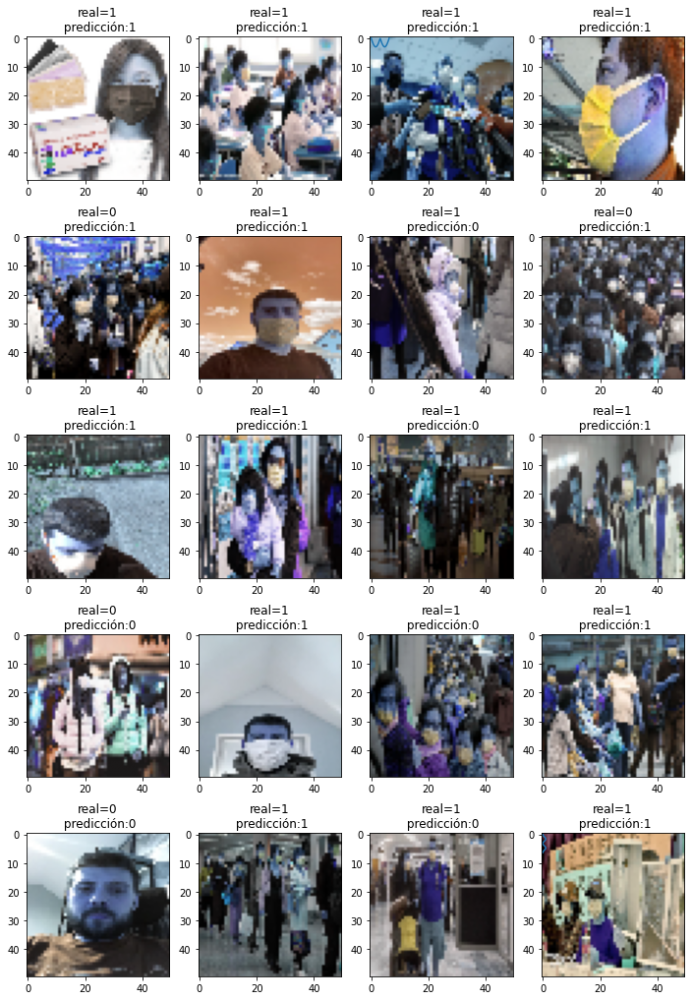

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = model_vgg19.predict_classes(data)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


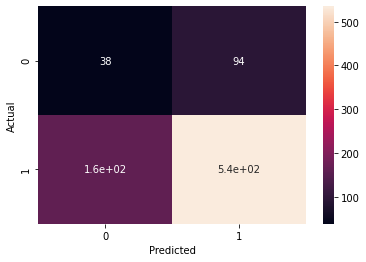

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(label, ynew)

array([[ 38,  94],
       [162, 535]])

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.5179269112649695
0.5202782193958665
0.5277270553454197


###MOBILENET

####DATA

In [ ]:
datasetPath = '/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/'
maskPath = datasetPath + 'with_mask/'
nonMaskPath = datasetPath + 'without_mask/'
y_mask = []
x_mask = []
y_no_mask = []
x_no_mask = []
iterador = 0


ruta_base = nonMaskPath
classes = os.listdir(nonMaskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(100,100))
  x_no_mask.append(resized_img/255.0)
  y_no_mask.append(0)
print(np.shape(y_no_mask))

ruta_base = maskPath
classes = os.listdir(maskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(100,100))
  x_mask.append(resized_img/255.0)
  y_mask.append(1)
print(np.shape(y_mask))


x_mask = np.array(x_mask)
y_mask = np.array(y_mask)
x_no_mask = np.array(x_no_mask)
y_no_mask = np.array(y_no_mask)

(3828,)
(3725,)


In [ ]:
x =  np.concatenate((x_no_mask,x_mask))
y = np.concatenate((y_no_mask,y_mask))
print('x',x.shape,'y',y.shape)

x (7553, 100, 100, 3) y (7553,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state=0)
print('X_train:',X_train.shape)
print('X_test:',X_test.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

X_train: (5664, 100, 100, 3)
X_test: (1889, 100, 100, 3)
y_train: (5664,)
y_test: (1889,)


In [ ]:
import tensorflow as tf
y_test = tf.keras.utils.to_categorical(y_test) #el one hot encoding
y_train = tf.keras.utils.to_categorical(y_train) 

In [ ]:
img_folder = '/content/drive/MyDrive/proyecto IA2/prueba_test/images/'
annot_folder = '/content/drive/MyDrive/proyecto IA2/prueba_test/annotations/'
desc = []
for dirname, _, filenames in os.walk(annot_folder):
    for filename in filenames:
        desc.append(os.path.join(dirname, filename))

In [ ]:
img_name,label = [],[]

for d in desc:
    content = []
    n = []

    with open(d, "r") as file:
        content = file.readlines()
    content = "".join(content)
    soup = BeautifulSoup(content,"html.parser")
    file_name = soup.filename.string
    name_tags = soup.find_all("name")
    

    for t in name_tags:
        n.append(t.get_text())
        
    # slecting tag with maximum occurence in an image (If it has multiple tags)
    name = max(set(n), key = n.count)
  
    img_name.append(file_name)
    if (name == 'with_mask'):
      name = 1
      label.append(name)
    elif (name == 'mask_weared_incorrect'):
      name = 2
      label.append(name)
    elif (name == 'without_mask'):
      name = 0
      label.append(name)


In [ ]:
data, target = [],[]
img_h, img_w = 100, 100

for i in range(len(img_name)):
    
    name = img_name[i]
    path = img_folder + name
    

    img = cv2.imread(path)
    img = cv2.resize(img,(100,100))
    image = img/255.0

    # image = load_img(path, target_size = (img_h, img_w))
    # image = img_to_array(image)
    data.append(image)
    target.append(tuple(labels.iloc[i,:]))

In [ ]:
data = np.array(data)
target = np.array(target)
print("data shapes : ",(data.shape))
print("target shapes : ",(target.shape))

data shapes :  (853, 100, 100, 3)
target shapes :  (853, 3)


In [ ]:
labels.groupby([0]).count()

,1,2
0,,
0,719,719
1,134,134


In [ ]:
data = np.delete(data, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 400, 508, 521, 597, 681, 691, 815, 822, 832), axis=0)
target = np.delete(target, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 400, 508, 521, 597, 681, 691, 815, 822, 832), axis=0)
print('eliminados')

eliminados


In [ ]:
label = np.delete(label, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 400, 508, 521, 597, 681, 691, 815, 822, 832), axis=0)

In [ ]:
datasetPath = '/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/validation/'
maskPath = datasetPath + 'with_mask/'
nonMaskPath = datasetPath + 'no_mask/'
y_mask_validate = []
x_mask_validate = []
y_no_mask_validate = []
x_no_mask_validate = []
iterador = 0


ruta_base = nonMaskPath
classes = os.listdir(nonMaskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(100,100))
  x_no_mask_validate.append(resized_img/255.0)
  y_no_mask_validate.append(0)
print(np.shape(y_no_mask_validate))
  

ruta_base = maskPath
classes = os.listdir(maskPath)
for ruta in classes:
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(100,100))
  x_mask_validate.append(resized_img/255.0)
  y_mask_validate.append(1)
print(np.shape(x_mask_validate))

x_mask_validate = np.array(x_mask_validate)
y_mask_validate = np.array(y_mask_validate)
x_no_mask_validate = np.array(x_no_mask_validate)
y_no_mask_validate = np.array(y_no_mask_validate)

(10,)
(10, 100, 100, 3)


In [ ]:
x_validate =  np.concatenate((x_no_mask_validate,x_mask_validate))
y_validate = np.concatenate((y_no_mask_validate,y_mask_validate))
print('x',x_validate.shape,'y',y_validate.shape)

x (20, 100, 100, 3) y (20,)


#####TRAIN

In [ ]:
mobil = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=X_train[0].shape, weights='imagenet', include_top=False)

In [ ]:
for layer in mobil.layers:
	layer.trainable = False
new_mobil = tf.keras.models.Sequential()
new_mobil.add(mobil)
new_mobil.add(tf.keras.layers.Flatten(name="flatten"))
new_mobil.add(tf.keras.layers.Dense(128, activation="relu"))
new_mobil.add(tf.keras.layers.Dropout(0.5))
new_mobil.add(tf.keras.layers.Dense(2, activation="softmax"))
new_mobil.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
flatten (Flatten)            (None, 20480)             0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)               2621568   
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 2)                 258       
Total params: 4,879,810
Trainable params: 2,621,826
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
INIT_LR = 1e-4
EPOCHS = 20
BS = 32
opt = tf.keras.optimizers.Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
new_mobil.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])

In [ ]:
new_mobil.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
flatten (Flatten)            (None, 20480)             0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)               2621568   
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 2)                 258       
Total params: 4,879,810
Trainable params: 2,621,826
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
new_mobil.compile(optimizer="adam",loss="categorical_crossentropy",metrics ="accuracy")
histories.append(new_mobil.fit_generator(datagen.flow(X_train, y_train, batch_size=50),
                    steps_per_epoch=X_train.shape[0]//50,
                    epochs=20,
                    verbose=1,
                    validation_data=(X_test, y_test)))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
113/113 [==============================] - 17s 129ms/step - loss: 3.3925 - accuracy: 0.8056 - val_loss: 0.1086 - val_accuracy: 0.9619
Epoch 2/20
113/113 [==============================] - 13s 115ms/step - loss: 0.1839 - accuracy: 0.9292 - val_loss: 0.1090 - val_accuracy: 0.9598
Epoch 3/20
113/113 [==============================] - 13s 117ms/step - loss: 0.1434 - accuracy: 0.9445 - val_loss: 0.0899 - val_accuracy: 0.9704
Epoch 4/20
113/113 [==============================] - 13s 118ms/step - loss: 0.1446 - accuracy: 0.9493 - val_loss: 0.0893 - val_accuracy: 0.9645
Epoch 5/20
113/113 [==============================] - 13s 116ms/step - loss: 0.1587 - accuracy: 0.9411 - val_loss: 0.0956 - val_accuracy: 0.9698
Epoch 6/20
113/113 [==============================] - 13s 117ms/step - loss: 0.1326 - accuracy: 0.9564 - val_loss: 0.0871 - val_accuracy: 0.9704
Epoch 7/20
113/113 [==============================] - 13s 117ms/step - loss: 0.1308 - accuracy: 0.9534 - val_loss: 0.0888 - val_ac

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.8528347406513872




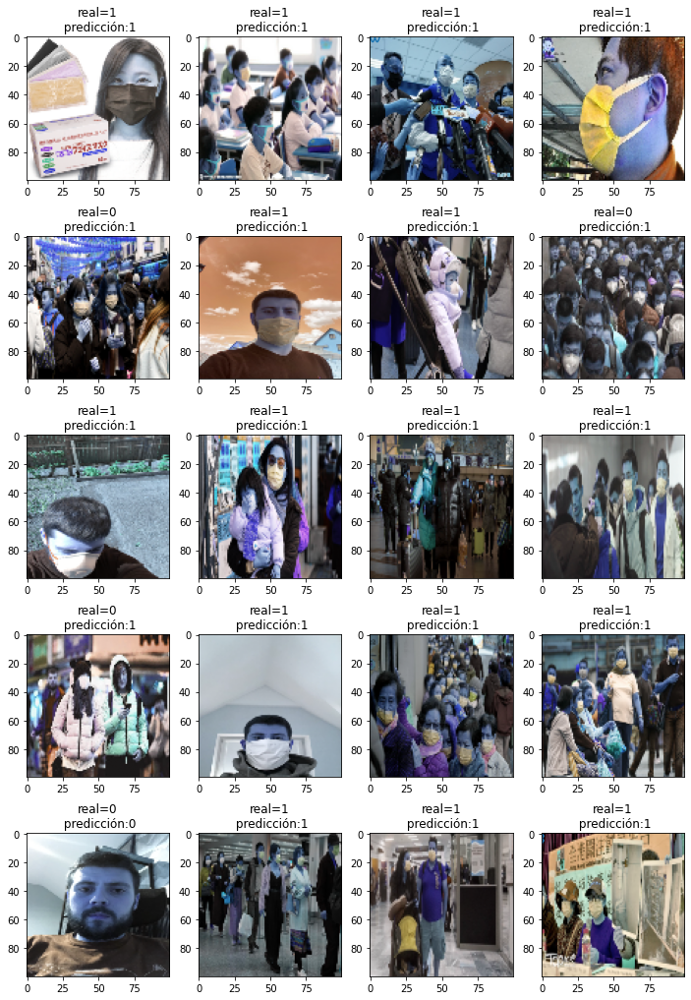

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = new_mobil.predict_classes(data)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


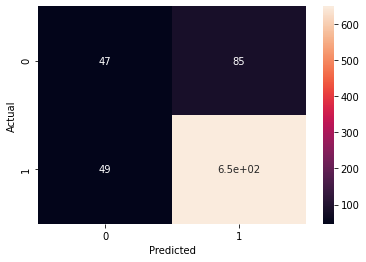

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.6592872040240461
0.6868107662573897
0.6428796574061997


PORCENTAJE PREDICCIÓN = 0.95




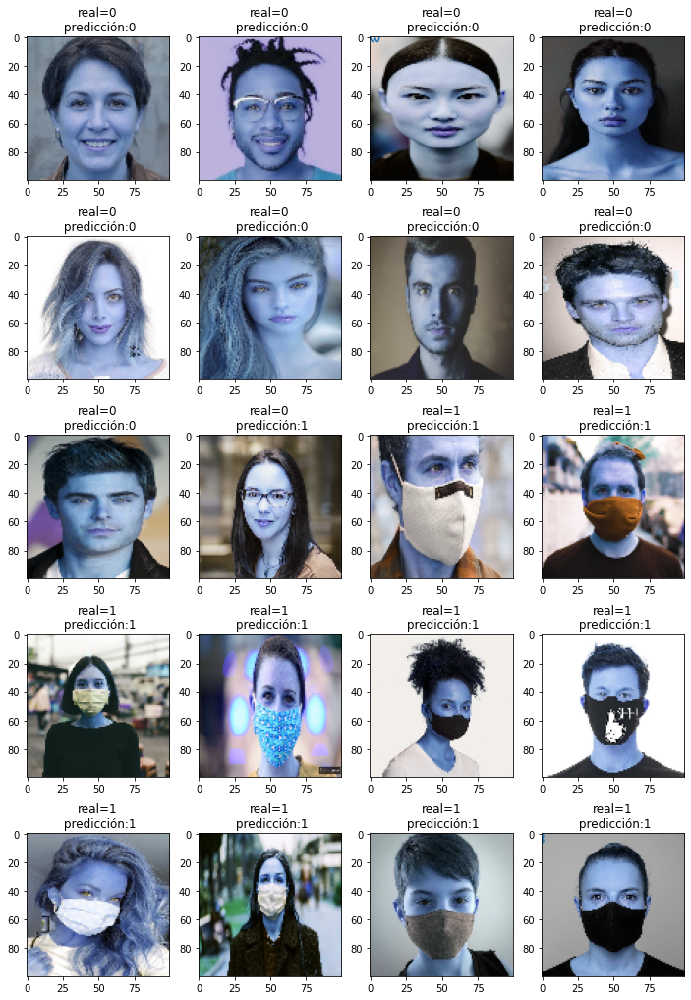

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = np.argmax(new_mobil.predict(x_validate),axis=1)

for i in range(columns*rows):
    img = x_validate[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(y_validate[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(y_validate[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(y_validate, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


###DESNET 121

In [ ]:
model_des = tf.keras.applications.DenseNet121(
                include_top=False, weights='imagenet', input_tensor=None,
                input_shape=None, pooling=None, classes=2
            )
model_des.trainable = False
model_des.summary()

Model: "densenet121"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, None, None, 6 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, None, None, 6 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [ ]:
model_des.trainable = True
print("Total ayers of Mobilenet: ", len(model_des.layers))
for layer in model_des.layers[10:150]:
  layer.trainable =  False
for layer in model_des.layers[300:310]:
  layer.trainable =  False
print(len(model_des.trainable_variables))

Total ayers of Mobilenet:  427
234


In [ ]:
drop = tf.keras.layers.Dropout(0.5)
prediction_layer = tf.keras.layers.Dense(50,activation='tanh')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
flatten_layer = tf.keras.layers.Flatten()
global_average_layer = tf.keras.layers.GlobalAveragePooling2D() 

In [ ]:
model_B_on_des = tf.keras.Sequential([
  model_des,
  global_average_layer,
  drop,
  prediction_layer
])

model_B_on_des.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Functional)     (None, None, None, 1024)  7037504   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1024)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 2050      
Total params: 7,039,554
Trainable params: 5,268,162
Non-trainable params: 1,771,392
_________________________________________________________________


In [ ]:
learning_rate= 0.0001

opt = tf.keras.optimizers.SGD(lr=learning_rate)
model_B_on_des.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])
histories.append(model_B_on_des.fit(datagen.flow(X_train, y_train, batch_size=50), epochs=20,verbose=1, batch_size=30,validation_data=(X_test, y_test)))

Epoch 1/20
114/114 [==============================] - 57s 142ms/step - loss: 1.2633 - accuracy: 0.5032 - val_loss: 0.8110 - val_accuracy: 0.5437
Epoch 2/20
114/114 [==============================] - 12s 101ms/step - loss: 1.0752 - accuracy: 0.5674 - val_loss: 0.6749 - val_accuracy: 0.6310
Epoch 3/20
114/114 [==============================] - 12s 102ms/step - loss: 0.9760 - accuracy: 0.5982 - val_loss: 0.6053 - val_accuracy: 0.6834
Epoch 4/20
114/114 [==============================] - 12s 102ms/step - loss: 0.8793 - accuracy: 0.6318 - val_loss: 0.5766 - val_accuracy: 0.7253
Epoch 5/20
114/114 [==============================] - 12s 101ms/step - loss: 0.8248 - accuracy: 0.6469 - val_loss: 0.5209 - val_accuracy: 0.7570
Epoch 6/20
114/114 [==============================] - 12s 102ms/step - loss: 0.7296 - accuracy: 0.6836 - val_loss: 0.4858 - val_accuracy: 0.7835
Epoch 7/20
114/114 [==============================] - 12s 102ms/step - loss: 0.7048 - accuracy: 0.6996 - val_loss: 0.4587 - val_ac

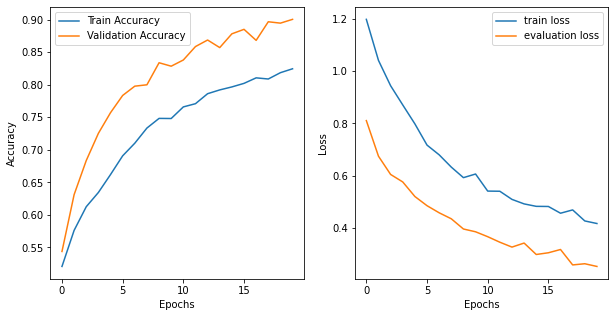

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 2, 1)
ax.plot(histories[5].history['accuracy'], label='Train Accuracy');
ax.plot(histories[5].history['val_accuracy'], label='Validation Accuracy');
ax.set_xlabel('Epochs');
ax.set_ylabel('Accuracy');
ax.legend();
ax = fig.add_subplot(1, 2, 2)
ax.plot(histories[5].history['loss'], label='train loss');
ax.plot(histories[5].history['val_loss'], label='evaluation loss');
ax.legend();
ax.set_xlabel('Epochs');
ax.set_ylabel('Loss');

######VALIDATION

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.7218863361547763




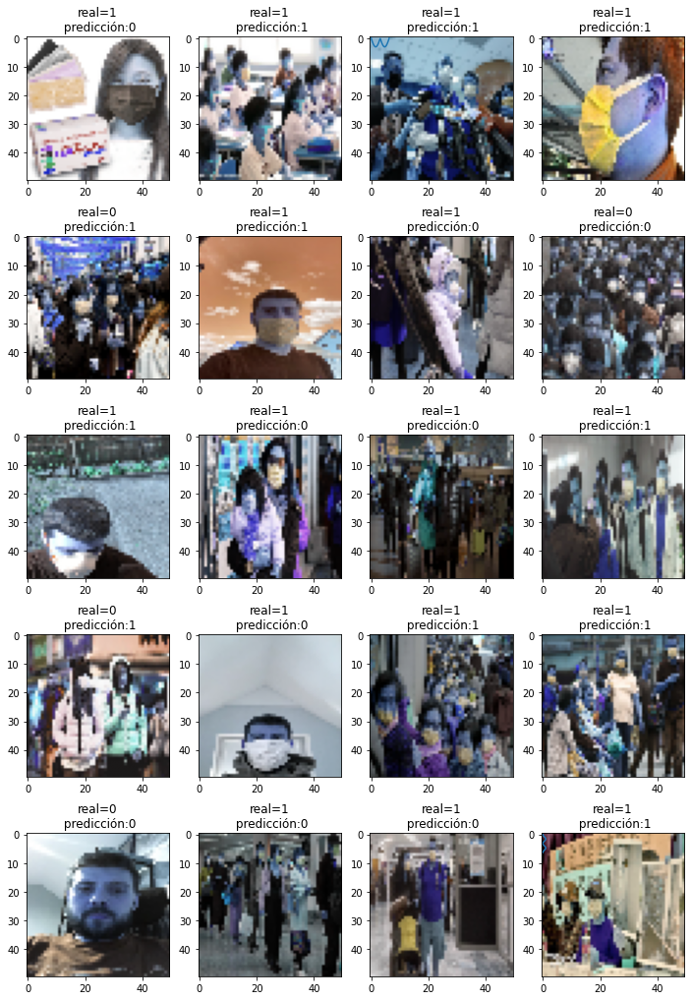

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = model_B_on_des.predict_classes(data)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


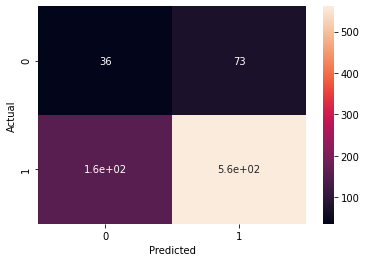

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.5341461264156119
0.5356932707866822
0.5558061383557793


#COMPARACION

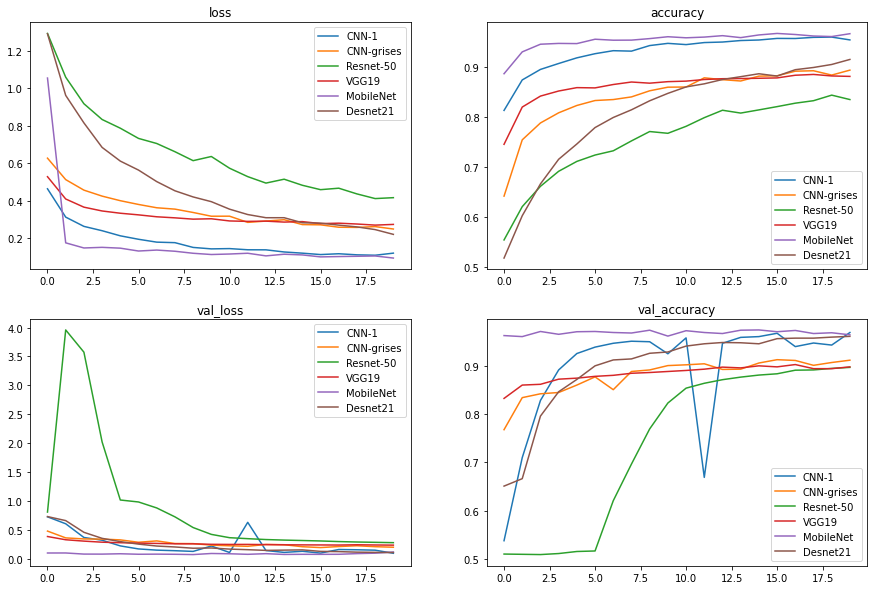

In [ ]:
redes = ['CNN-1','CNN-grises','Resnet-50','VGG19','MobileNet','Desnet21']

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
for metric in histories[0].history:
    index = list(histories[0].history).index(metric)
    ax = axes.flatten()[index]
    layer_num = 0
    for history in histories:
        layer_num += 1
        ax.plot(history.history[metric], label=redes[layer_num-1])
    ax.set_title(metric)
    ax.legend()
plt.show()

#CONFIGURACIONES CON LAS MEJORES REDES

In [ ]:
datasetPath = '/content/drive/MyDrive/proyecto IA2/self-built-masked-face-recognition-dataset/'
maskPath = datasetPath + 'with_mask/'
nonMaskPath = datasetPath + 'without_mask/'
y_mask = []
x_mask = []
y_no_mask = []
x_no_mask = []
iterador = 0


ruta_base = nonMaskPath
classes = os.listdir(nonMaskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(100,100))
  x_no_mask.append(resized_img/255.0)
  y_no_mask.append(0)
print(np.shape(y_no_mask))

ruta_base = maskPath
classes = os.listdir(maskPath)
for ruta in (classes):
  img = cv2.imread(ruta_base + '/' + ruta)
  resized_img=cv2.resize(img,(100,100))
  x_mask.append(resized_img/255.0)
  y_mask.append(1)
print(np.shape(y_mask))


x_mask = np.array(x_mask)
y_mask = np.array(y_mask)
x_no_mask = np.array(x_no_mask)
y_no_mask = np.array(y_no_mask)

(3828,)
(3725,)


In [ ]:
x =  np.concatenate((x_no_mask,x_mask))
y = np.concatenate((y_no_mask,y_mask))
print('x',x.shape,'y',y.shape)

x (7553, 100, 100, 3) y (7553,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state=0)
print('X_train:',X_train.shape)
print('X_test:',X_test.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

In [ ]:
import tensorflow as tf
y_test = tf.keras.utils.to_categorical(y_test) #el one hot encoding
y_train = tf.keras.utils.to_categorical(y_train) 

In [ ]:
img_folder = '/content/drive/MyDrive/proyecto IA2/prueba_test/images/'
annot_folder = '/content/drive/MyDrive/proyecto IA2/prueba_test/annotations/'
desc = []
for dirname, _, filenames in os.walk(annot_folder):
    for filename in filenames:
        desc.append(os.path.join(dirname, filename))

In [ ]:
img_name,label = [],[]

for d in desc:
    content = []
    n = []

    with open(d, "r") as file:
        content = file.readlines()
    content = "".join(content)
    soup = BeautifulSoup(content,"html.parser")
    file_name = soup.filename.string
    name_tags = soup.find_all("name")
    

    for t in name_tags:
        n.append(t.get_text())
        
    # slecting tag with maximum occurence in an image (If it has multiple tags)
    name = max(set(n), key = n.count)
  
    img_name.append(file_name)
    if (name == 'with_mask'):
      name = 1
      label.append(name)
    elif (name == 'mask_weared_incorrect'):
      name = 2
      label.append(name)
    elif (name == 'without_mask'):
      name = 0
      label.append(name)


In [ ]:
data, target = [],[]
img_h, img_w = 100, 100

for i in range(len(img_name)):
    
    name = img_name[i]
    path = img_folder + name
    

    img = cv2.imread(path)
    img = cv2.resize(img,(100,100))
    image = img/255.0

    # image = load_img(path, target_size = (img_h, img_w))
    # image = img_to_array(image)
    data.append(image)
    target.append(tuple(labels.iloc[i,:]))

In [ ]:
data = np.array(data)
target = np.array(target)
print("data shapes : ",(data.shape))
print("target shapes : ",(target.shape))

In [ ]:
array = np.array(label)
eliminar = np.where(array == 2)
print(eliminar)

(array([], dtype=int64),)


In [ ]:
data = np.delete(data, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832,370), axis=0)
target = np.delete(target, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832,370), axis=0)
print('eliminados')

eliminados


In [ ]:
label = np.delete(label, (73,  95,  96, 149, 158, 162, 197, 202, 224, 228, 238, 269, 344,
       355, 373, 388, 400, 508, 521, 597, 681, 691, 815, 822, 832,370), axis=0)

In [ ]:
histories2 = []

#### PRIMER MODELO -V2

In [ ]:
primer_modelo = tf.keras.models.Sequential()
primer_modelo.add(tf.keras.layers.Conv2D(200, (3, 3), activation='elu', padding='same', input_shape=(X_train.shape[1], X_train.shape[1], 3)))
primer_modelo.add(tf.keras.layers.BatchNormalization())
primer_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
primer_modelo.add(tf.keras.layers.Conv2D(100, (3, 3), activation='elu', kernel_initializer='glorot_normal', bias_initializer='glorot_normal', padding='same'))
primer_modelo.add(tf.keras.layers.MaxPooling2D((3, 3)))
primer_modelo.add(tf.keras.layers.BatchNormalization())
primer_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
primer_modelo.add(tf.keras.layers.Conv2D(100, (3, 3), activation='elu', kernel_initializer='glorot_normal', bias_initializer='glorot_normal', padding='same'))
primer_modelo.add(tf.keras.layers.MaxPooling2D((2, 2)))
primer_modelo.add(tf.keras.layers.Flatten())
primer_modelo.add(tf.keras.layers.Dropout(0.5))
primer_modelo.add(tf.keras.layers.Dense(50, activation='elu'))
primer_modelo.add(tf.keras.layers.Dropout(0.2))
primer_modelo.add(tf.keras.layers.Dense(2, activation='softmax'))

primer_modelo.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 100, 100, 200)     5600      
_________________________________________________________________
batch_normalization (BatchNo (None, 100, 100, 200)     800       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 50, 50, 200)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 50, 50, 100)       180100    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 100)       0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 100)       400       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 100)         0

In [ ]:
opt = tf.keras.optimizers.Adam()
primer_modelo.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
datagen = ImageDataGenerator(
        featurewise_center=False,  
        samplewise_center=False,  
        featurewise_std_normalization=False,  
        samplewise_std_normalization=False,  
        zca_whitening=False,    
        rotation_range=25,    
        width_shift_range=0.1,
        height_shift_range=0.1,  
        horizontal_flip=True,  
        vertical_flip=False)
datagen.fit(X_train)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/proyecto IA2/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

histories2.append(primer_modelo.fit(datagen.flow(X_train, y_train,seed=10,shuffle=False, batch_size=50), epochs=20,verbose=1,
                    validation_data=(X_test, y_test),callbacks=[cp_callback]))

Epoch 1/20
114/114 [==============================] - 50s 152ms/step - loss: 0.7899 - accuracy: 0.7538 - val_loss: 1.1270 - val_accuracy: 0.5294

Epoch 00001: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 2/20
114/114 [==============================] - 16s 144ms/step - loss: 0.3555 - accuracy: 0.8559 - val_loss: 0.9133 - val_accuracy: 0.6136

Epoch 00002: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 3/20
114/114 [==============================] - 16s 144ms/step - loss: 0.3114 - accuracy: 0.8749 - val_loss: 0.2902 - val_accuracy: 0.8798

Epoch 00003: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 4/20
114/114 [==============================] - 16s 143ms/step - loss: 0.2586 - accuracy: 0.8943 - val_loss: 0.2489 - val_accuracy: 0.8957

Epoch 00004: saving model to /content/drive/MyDrive/proyecto IA2/cp.ckpt
Epoch 5/20
114/114 [==============================] - 17s 144ms/step - loss: 0.2213 - accuracy: 0.9181 - val_loss: 0.1951 - 

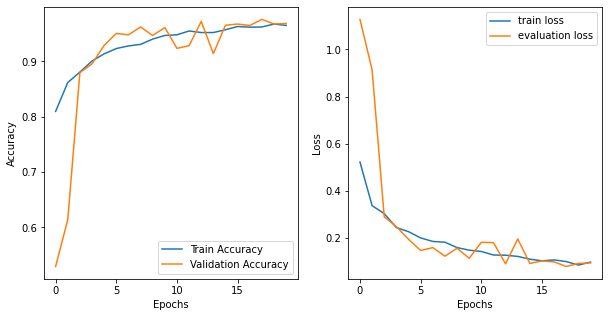

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 2, 1)
ax.plot(histories2[0].history['accuracy'], label='Train Accuracy');
ax.plot(histories2[0].history['val_accuracy'], label='Validation Accuracy');
ax.set_xlabel('Epochs')
ax.set_ylabel('Accuracy');
ax.legend();
ax = fig.add_subplot(1, 2, 2)
ax.plot(histories2[0].history['loss'], label='train loss');
ax.plot(histories2[0].history['val_loss'], label='evaluation loss');
ax.legend();
ax.set_xlabel('Epochs');
ax.set_ylabel('Loss');

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.8512696493349455




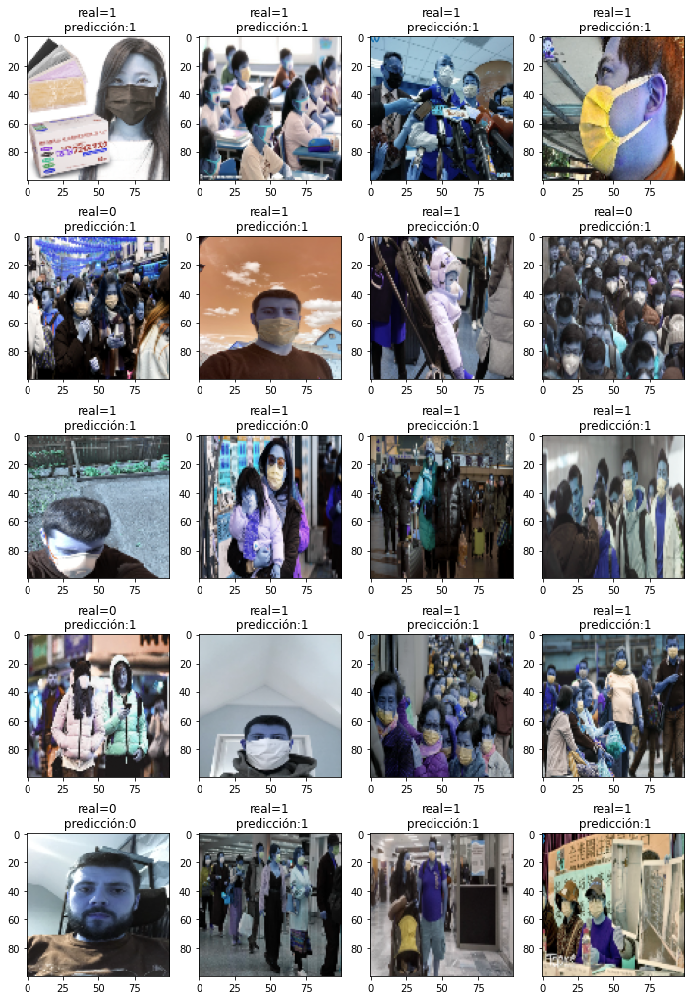

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = primer_modelo.predict_classes(data)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


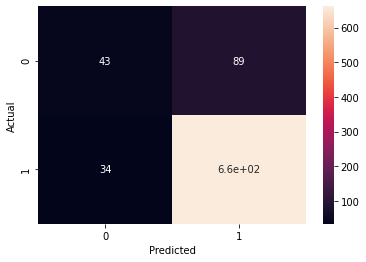

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.6631810731610404
0.7198874458874458
0.6384183562241116


###MOBILENET-V2

In [ ]:
mobil = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=X_train[0].shape, weights='imagenet', include_top=False)

In [ ]:
for layer in mobil.layers:
	layer.trainable = False
new_mobil = tf.keras.models.Sequential()
new_mobil.add(mobil)
new_mobil.add(tf.keras.layers.Flatten(name="flatten"))
new_mobil.add(tf.keras.layers.Dense(128, activation="relu"))
new_mobil.add(tf.keras.layers.Dropout(0.5))
new_mobil.add(tf.keras.layers.Dense(2, activation="softmax"))
new_mobil.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
flatten (Flatten)            (None, 20480)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               2621568   
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 258       
Total params: 4,879,810
Trainable params: 2,621,826
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
INIT_LR = 1e-4
EPOCHS = 20
BS = 20
opt = tf.keras.optimizers.Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
new_mobil.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])

In [ ]:
new_mobil.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
flatten (Flatten)            (None, 20480)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               2621568   
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 258       
Total params: 4,879,810
Trainable params: 2,621,826
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
new_mobil.compile(optimizer="adam",loss="categorical_crossentropy",metrics ="accuracy")
histories2.append(new_mobil.fit_generator(datagen.flow(X_train, y_train,seed=10, batch_size=50),
                    steps_per_epoch=X_train.shape[0]//50,
                    epochs=20,
                    verbose=1,
                    validation_data=(X_test, y_test)))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
113/113 [==============================] - 17s 130ms/step - loss: 1.1891 - accuracy: 0.8724 - val_loss: 0.1002 - val_accuracy: 0.9640
Epoch 2/20
113/113 [==============================] - 13s 116ms/step - loss: 0.1641 - accuracy: 0.9383 - val_loss: 0.0994 - val_accuracy: 0.9677
Epoch 3/20
113/113 [==============================] - 13s 117ms/step - loss: 0.1373 - accuracy: 0.9479 - val_loss: 0.0912 - val_accuracy: 0.9693
Epoch 4/20
113/113 [==============================] - 13s 116ms/step - loss: 0.1578 - accuracy: 0.9434 - val_loss: 0.1131 - val_accuracy: 0.9629
Epoch 5/20
113/113 [==============================] - 13s 115ms/step - loss: 0.1405 - accuracy: 0.9502 - val_loss: 0.0843 - val_accuracy: 0.9725
Epoch 6/20
113/113 [==============================] - 13s 116ms/step - loss: 0.1156 - accuracy: 0.9566 - val_loss: 0.0954 - val_accuracy: 0.9693
Epoch 7/20
113/113 [==============================] - 13s 116ms/step - loss: 0.1104 - accuracy: 0.9603 - val_loss: 0.0887 - val_ac

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


PORCENTAJE PREDICCIÓN = 0.845223700120919




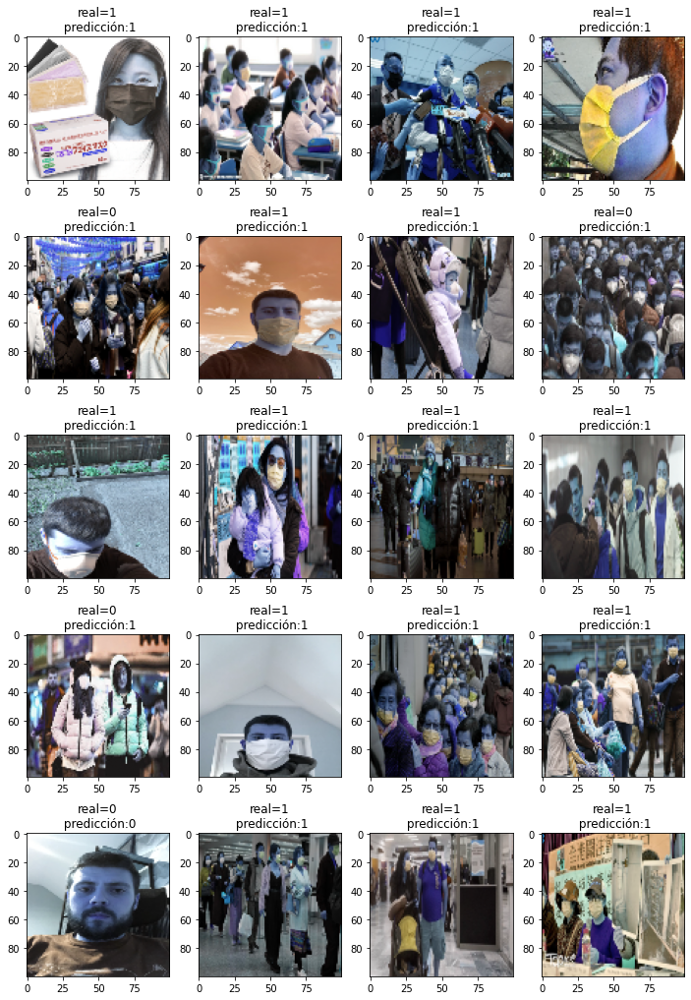

In [ ]:
fig = plt.figure(figsize=(12, 18))
columns = 4
rows = 5

# prep (x,y) for extra plotting
xs = np.linspace(0, 2*np.pi, 60)  # from 0 to 2pi
ys = np.abs(np.sin(xs))           # absolute of sine

# ax enables access to manipulate each of subplots
ax = []
porcentaje = 0
ynew = new_mobil.predict_classes(data)

for i in range(columns*rows):
    img = data[i]
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if(label[i] == ynew[i] ):
      porcentaje += 1
    ax[-1].set_title("real="+str(label[i])+"\n predicción:"+str(ynew[i]))
    plt.imshow(img)

# do extra plots on selected axes/subplots
# note: index starts with 0
ax[2].plot(xs, 3*ys)
ax[19].plot(ys**2, xs)

probabilidad = metrics.accuracy_score(label, ynew)

print('PORCENTAJE PREDICCIÓN = '+ str(probabilidad))
print('\n')

plt.show()  # finally, render the plot


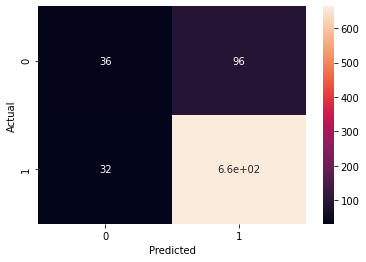

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

data = {'y_Actual':    label,
        'y_Predicted': ynew
        }

df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True)
plt.show()

In [ ]:
print(f1_score(label, ynew, average="macro"))
print(precision_score(label, ynew, average="macro"))
print(recall_score(label, ynew, average="macro"))   

0.6359834938101788
0.7014647756335736
0.6133420536298234
